### This notebook builds an end to end multiclass image classifier using TensorFlow

In [1]:
import tensorflow as tf
print("TF version:", tf.__version__)
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

TF version: 2.15.0
TF Hub version: 0.16.1


In [2]:
# make sure we are using GPU
print("GPU", "available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!)


##Getting our data ready (turning into Tensors)

In [3]:
# checking out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DogBreed1/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

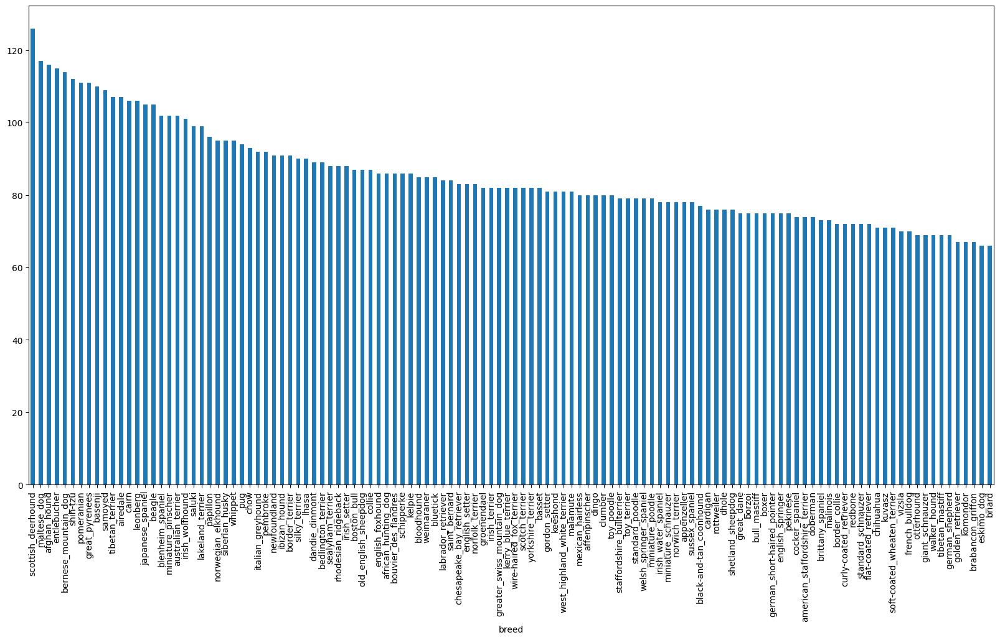

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

In [7]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/DogBreed1/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames[:5]


['/content/drive/MyDrive/DogBreed1/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogBreed1/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogBreed1/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogBreed1/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogBreed1/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/DogBreed1/train")) == len(filenames):
  print("File match")
else:
  print("File mismatch")

File match


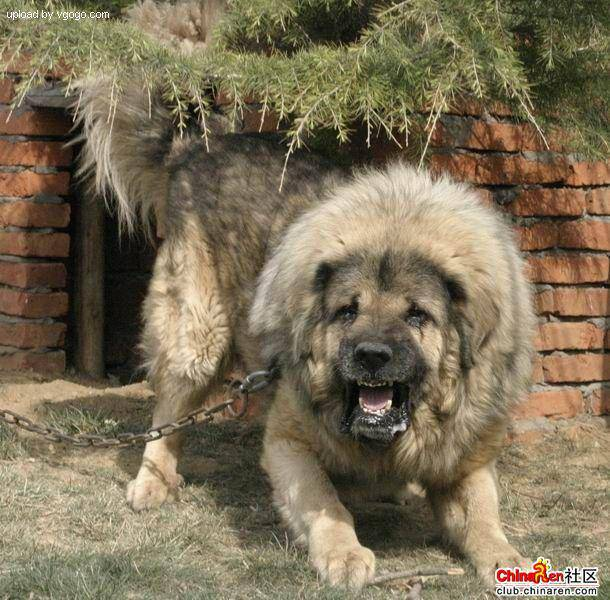

In [9]:
from IPython.display import Image
Image(filenames[9000])

In [10]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [11]:
# Since we have got our training image filepaths in a list, let's prepare our labels
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [12]:
len(labels)

10222

In [13]:
if len(labels) == len(filenames):
  print("File match")
else:
  print("File mismatch")

File match


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
len(boolean_labels)

10222

### Creating our own validation set
Since the dataset from Kaggle does not come with a validation set, we are going to create our own

In [18]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [19]:
# We are going to start off experimenting with ~1000 images and increase as needed
# Set number of images to use for experimenting
num_images = 1000  #@param{type:"slider", min:1000, max:10000, step:1000}

In [20]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
# Split them into training and validation of total size num_images
x_train, x_val, y_train, y_val = train_test_split(x[:num_images], y[:num_images], test_size=0.2, random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing Images (turning images into Tensors)


To preprocess our images into Tensors we are goint to write a function which does a few things:
1. Take an `image` filpath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modefied `image`

In [21]:
# Convert the image into a numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
print("Image shape:", image.shape)

Image shape: (257, 350, 3)


In [22]:
image.max(), image.min()

(255, 0)

In [23]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [24]:
# Define the image size
IMG_SIZE = 224
# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the image into numerical tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

### Turning our data into batches

Why turn our data into batches??

Let's say you are trying to process 10000+ images in one go. They al, might not fit into memory.

So that's why we do about 32 (batch size) images at a time.

In order to use TensorFlow effectively, we need our data in the form of tensor tuples which look like this:
`(image, label)`

In [25]:
# Create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [26]:
# Demo of the above
(process_image(x[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to tuen our data into tuples of Tensors in teh form: `(image, label)`, let's make a function to turn all of our data(x and y) into batches

In [27]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32
# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no label).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffle pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [28]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
# check out the difference attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [30]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a batch of data
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [31]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [32]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

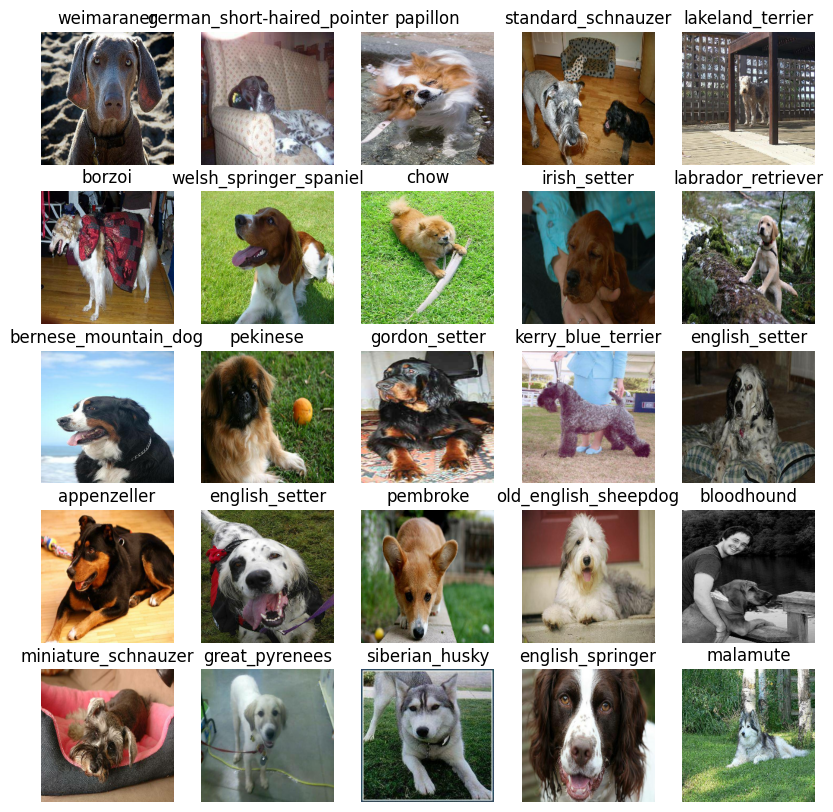

In [33]:
# Now let's visualize the data in training batch
show_25_images(train_images, train_labels)

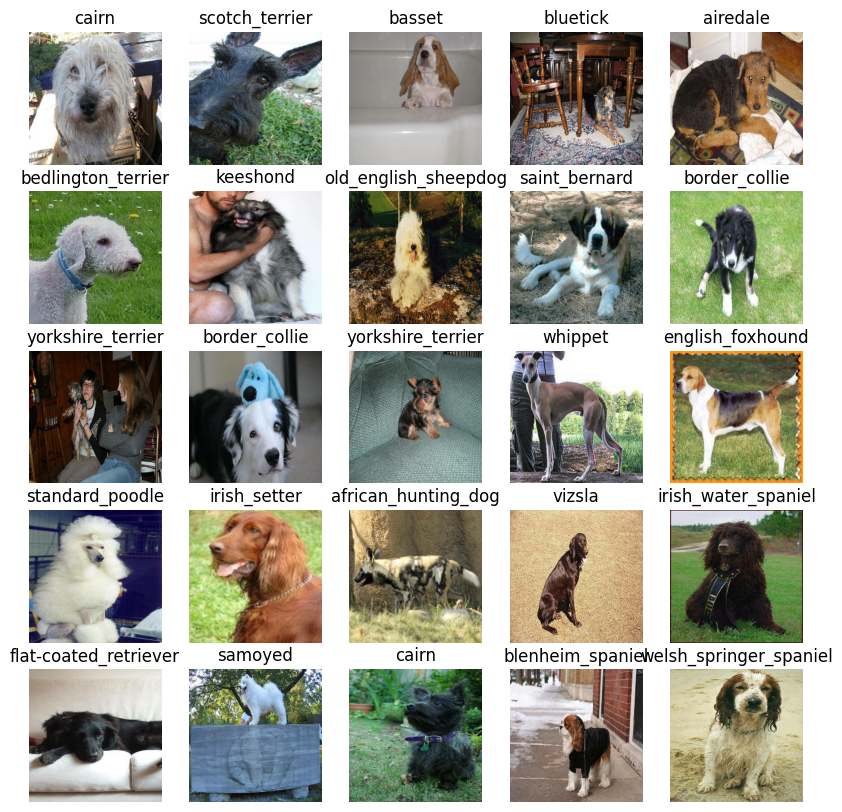

In [34]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Before we build a model, there are a few things we need to define:

* The input shape(our image shape, in the form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [35]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got our inputs, outputs and model ready to go. Let's put them together into Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters
* Define the layers in a keras model in sequential fashion (do this first, then that)
* Compiles the model (says it should be evaluatedand improved)
* Builds the model (tells the model the input shape it will be getting)
* Return the model.

In [36]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  # Setup the model layers
  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
  tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")]) # Layer 2 (output layer)
  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [37]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

In [38]:
### Tensor Board Callback
##Load the tensor board notebook extension
%load_ext tensorboard
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  log_dir = os.path.join("/content/drive/MyDrive/DogBreed1/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

#### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [39]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

#### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [40]:
Num_Epochs = 100 #@param {type:"slider", min:10, max:100, step:100}


Let's create a function which trains a model.
* Create a model using `create_model()`
* setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and  the callbacks we would like to use.
* Return the  model


In [41]:
# Build a function to train and return the model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()
  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data
  model.fit(x=train_data, epochs = Num_Epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [42]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 179s 6s/step - loss: 4.6358 - accuracy: 0.1025 - val_loss: 3.4411 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 4s 164ms/step - loss: 1.6503 - accuracy: 0.6762 - val_loss: 2.2133 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 146ms/step - loss: 0.5688 - accuracy: 0.9287 - val_loss: 1.7164 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 5s 198ms/step - loss: 0.2517 - accuracy: 0.9887 - val_loss: 1.5350 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 144ms/step - loss: 0.1480 - accuracy: 0.9962 - val_loss: 1.4450 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1014 - accuracy: 1.0000 - val_loss: 1.4019 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================]

In [43]:
### Checking the TensorBoard logs
# The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents
%tensorboard --logdir /content/drive/MyDrive/DogBreed1/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions on the trained data

In [44]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [45]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 113ms/step


array([[7.5563579e-04, 2.3963183e-04, 2.2744692e-03, ..., 6.0807462e-05,
        3.1664196e-05, 8.1013353e-04],
       [1.1770570e-03, 6.2242942e-04, 1.4169477e-02, ..., 9.1674621e-04,
        1.4761996e-03, 9.2810333e-05],
       [3.0391377e-05, 1.6818347e-04, 2.2199287e-04, ..., 5.1987724e-04,
        1.3446571e-04, 9.2869195e-05],
       ...,
       [8.3683281e-06, 5.0093222e-05, 5.7753059e-04, ..., 3.1565840e-05,
        1.2643171e-04, 1.3287100e-03],
       [1.8072417e-03, 1.5917177e-04, 1.9126697e-04, ..., 4.5904162e-05,
        1.0117757e-04, 3.3546621e-03],
       [4.8035363e-04, 8.5777079e-05, 3.0849020e-03, ..., 5.4689646e-03,
        1.0192952e-03, 5.2174099e-05]], dtype=float32)

In [46]:
predictions.shape

(200, 120)

In [47]:
# First prediction
index=0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predcted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.55635789e-04 2.39631830e-04 2.27446924e-03 4.97641333e-04
 9.23951971e-04 9.07914073e-05 1.92056242e-02 1.03377010e-04
 1.19788208e-04 6.33869146e-04 1.01617083e-03 4.80923656e-04
 3.11696174e-04 1.39308118e-04 4.11296962e-04 1.53695422e-04
 7.60690091e-05 4.31950927e-01 1.70328349e-05 1.05894760e-04
 1.28698954e-03 1.03163598e-04 1.09292057e-04 4.58119810e-03
 1.13591532e-05 1.72084168e-04 2.33584791e-02 1.16192445e-04
 3.69310961e-04 3.60916922e-04 5.49399934e-04 1.00693211e-03
 7.28773302e-04 1.20063283e-04 1.25268125e-04 2.68806815e-02
 6.46721892e-05 1.59712136e-03 6.99860626e-04 4.76469402e-04
 3.77165014e-03 2.93096564e-05 1.26994477e-04 4.46322811e-04
 1.19712495e-04 1.26440762e-04 2.28418012e-05 4.04449936e-04
 1.16978178e-03 8.52547673e-05 2.23531373e-04 4.74670451e-05
 6.35207398e-04 2.10085054e-04 5.52235506e-05 8.70240729e-06
 4.41981792e-05 3.01299663e-03 1.57328730e-04 8.13488513e-02
 4.85096505e-04 3.76278149e-05 8.04949028e-04 9.43954819e-06
 4.15159710e-04 2.608980

In [48]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image, the prediction is being made on!

**Note:** Prediction are also known as confidence levels

In [49]:
# Turn the prediction into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
# Get the predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [50]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) tuples and returns separate arrays
  for images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
va_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

### Visualize
We will create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities toas predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [51]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View teh prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label))


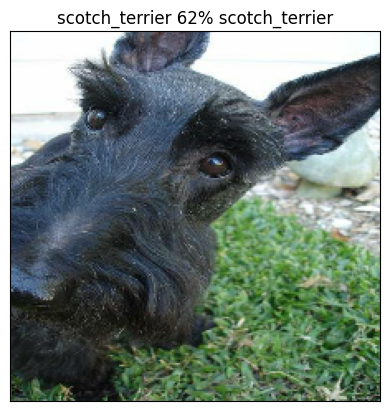

In [52]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

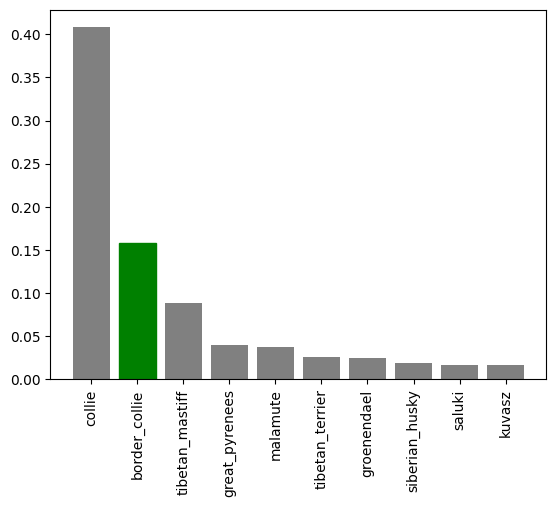

In [53]:
# Let's make a function to view our models top 10 predictions
## Take an input of prediction probabilities array and a ground truth array and an integer
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n],labels[n]
  # Get the prediction label
  pred_label=get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Get the top 10 prediction probabilities
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Get the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=9)

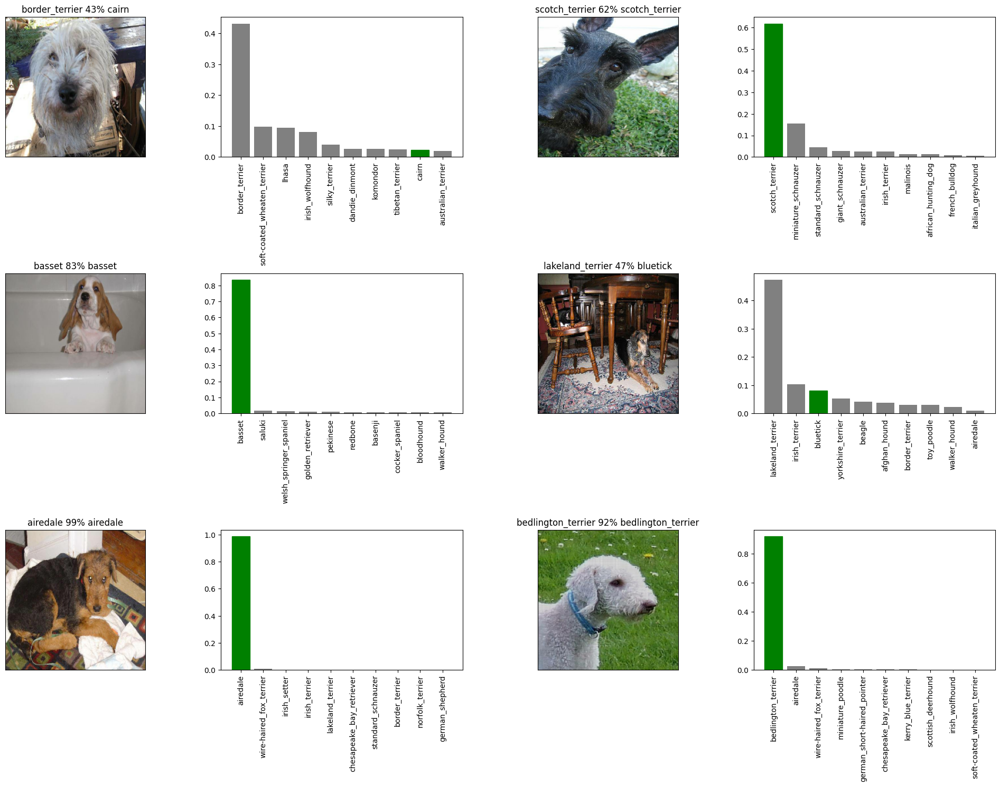

In [111]:
# Let's check out a few prediction and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout()
plt.show()

### Saving and reloading a trained model

In [55]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory pathname with current time
  """
  # Create a model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/DogBreed1/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir+"-"+suffix+".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [56]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we have got functions to save and load a trained model, let's make sure they work!

In [57]:
## Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/DogBreed1/models/20240716-075556-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/DogBreed1/models/20240716-075556-1000-images-mobilenetv2-Adam.h5'

In [58]:
# Load a trained model
loaded_1000_image_model=load_model('/content/drive/MyDrive/DogBreed1/models/20240714-113846-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/DogBreed1/models/20240714-113846-1000-images-mobilenetv2-Adam.h5


In [59]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 123ms/step - loss: 1.3116 - accuracy: 0.6400


[1.3115942478179932, 0.6399999856948853]

In [60]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.3059 - accuracy: 0.6500


[1.305922269821167, 0.6499999761581421]

In [61]:
### Trained a big dog model(on the full data)
len(x), len(y)

(10222, 10222)

In [62]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [63]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [64]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [65]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [66]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=10,   # It should be Num_Epochs, 10 is there just to lessen the runtime
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/10
320/320 [==============================] - ETA: 0s - loss: 1.2937 - accuracy: 0.6746

320/320 [==============================] - 48s 139ms/step - loss: 1.2937 - accuracy: 0.6746
Epoch 2/10
319/320 [============================>.] - ETA: 0s - loss: 0.3922 - accuracy: 0.8868

320/320 [==============================] - 44s 136ms/step - loss: 0.3919 - accuracy: 0.8869
Epoch 3/10
319/320 [============================>.] - ETA: 0s - loss: 0.2341 - accuracy: 0.9342

320/320 [==============================] - 43s 134ms/step - loss: 0.2342 - accuracy: 0.9340
Epoch 4/10
319/320 [============================>.] - ETA: 0s - loss: 0.1515 - accuracy: 0.9658

320/320 [==============================] - 42s 130ms/step - loss: 0.1518 - accuracy: 0.9656
Epoch 5/10
320/320 [==============================] - ETA: 0s - loss: 0.1050 - accuracy: 0.9785

320/320 [==============================] - 42s 132ms/step - loss: 0.1050 - accuracy: 0.9785
Epoch 6/10
320/320 [==============================] - ETA: 0s - loss: 0.0775 - accuracy: 0.9873

320/320 [==============================] - 41s 129ms/step - loss: 0.0775 - accuracy: 0.9873
Epoch 7/10
320/320 [==============================] - ETA: 0s - loss: 0.0567 - accuracy: 0.9927

320/320 [==============================] - 41s 128ms/step - loss: 0.0567 - accuracy: 0.9927
Epoch 8/10
319/320 [============================>.] - ETA: 0s - loss: 0.0462 - accuracy: 0.9941

320/320 [==============================] - 41s 126ms/step - loss: 0.0462 - accuracy: 0.9941
Epoch 9/10
319/320 [============================>.] - ETA: 0s - loss: 0.0385 - accuracy: 0.9956

320/320 [==============================] - 42s 132ms/step - loss: 0.0385 - accuracy: 0.9956
Epoch 10/10
319/320 [============================>.] - ETA: 0s - loss: 0.0319 - accuracy: 0.9966

320/320 [==============================] - 42s 131ms/step - loss: 0.0319 - accuracy: 0.9966


In [67]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/DogBreed1/models/20240716-080628-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/DogBreed1/models/20240716-080628-full-image-set-mobilenetv2-Adam.h5'

In [69]:
loaded_full_model=load_model('/content/drive/MyDrive/DogBreed1/models/20240716-080628-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/DogBreed1/models/20240716-080628-full-image-set-mobilenetv2-Adam.h5


## Make predictions on the test dataset
Since our model has been trained on image in the form of Tensor batches, to amke predictions on the test data, wi will have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

In [77]:
# Load the image filnames
test_path = "/content/drive/MyDrive/DogBreed1/test/"
test_filenames = [test_path + filename for filename in os.listdir(test_path) if os.path.isfile(test_path + filename)]
test_filenames[:5]

['/content/drive/MyDrive/DogBreed1/test/de85fdcf74dbe025b9b89819735cb9bc.jpg',
 '/content/drive/MyDrive/DogBreed1/test/e2b6d4957b62934bd831c3a1b65e2ebb.jpg',
 '/content/drive/MyDrive/DogBreed1/test/df903a0522873bebca93d1d93bc60bc4.jpg',
 '/content/drive/MyDrive/DogBreed1/test/e3a55cc9c91da472abbced51d98d6ff6.jpg',
 '/content/drive/MyDrive/DogBreed1/test/e42105cc55af6788d3c15473c562dc77.jpg']

In [78]:
# Create a test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [79]:
# Make predictions on the test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 162s 501ms/step


In [80]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/DogBreed1/test_predictions.csv", test_predictions, delimiter=",")

In [81]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/DogBreed1/test_predictions.csv", delimiter=",")

In [83]:
test_predictions.shape

(10357, 120)

## Preparing the dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

In [84]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [85]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [101]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.shape

(10358, 121)

In [104]:
set(preds_df)-set(test_path)

{'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [107]:
if test_predictions.shape[0] > preds_df.shape[0]:
        print("Extra data is in 'test_predictions'. Removing last row...")
        test_predictions = test_predictions[:-1, :]
else:
        print("Extra data is in 'preds_df'. Removing last row...")
        preds_df = preds_df.iloc[:-1, :]

Extra data is in 'preds_df'. Removing last row...


In [108]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

<ipython-input-108-78d50a7455c5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preds_df[list(unique_breeds)] = test_predictions


In [109]:
# Save our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("/content/drive/MyDrive/DogBreed1/fullmodelprediction_submission1_mobilenetV2.csv", index=False)